In [140]:
conda install -c conda-forge geopandas


Retrieving notices: ...working... done
Channels:
 - conda-forge
 - defaults
Platform: osx-arm64
Solving environment: done

## Package Plan ##

  environment location: /opt/homebrew/anaconda3

  added / updated specs:
    - geopandas


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    branca-0.7.2               |     pyhd8ed1ab_0          28 KB  conda-forge
    cairo-1.16.0               |       h302bd0f_5         1.0 MB
    certifi-2024.8.30          |     pyhd8ed1ab_0         160 KB  conda-forge
    click-plugins-1.1.1        |             py_0           9 KB  conda-forge
    cligj-0.7.2                |     pyhd8ed1ab_1          10 KB  conda-forge
    conda-24.11.0              |  py312h81bd7bf_0         1.1 MB  conda-forge
    fiona-1.9.5                |  py312hd77ebd4_0         905 KB
    folium-0.18.0              |     pyhd8ed1ab_0          77 KB  conda-forge
    fontconfig-2.14.2  

In [358]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import datetime as dt
import warnings
import math
#colors = ['#c1121f','#669bbc', '#f4d35e', '#e9724c', '#ffc857']
import geopandas as gpd

In [389]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [380]:
num_countries = df['Country'].nunique()
print(f"The dataset contains {num_countries} unique countries.")


The dataset contains 193 unique countries.


In [381]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

In [400]:
df.shape

(2938, 22)

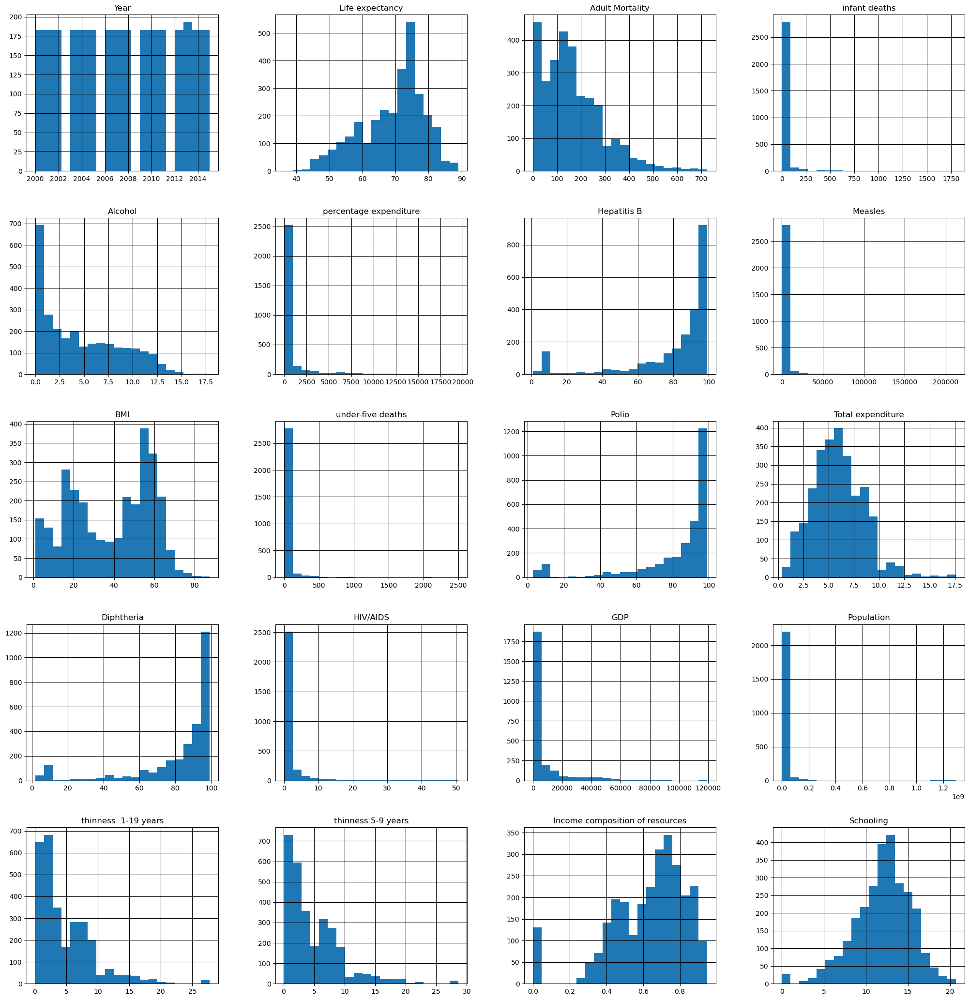

In [401]:
df.hist(bins=20, figsize=(25,26))
plt.show()

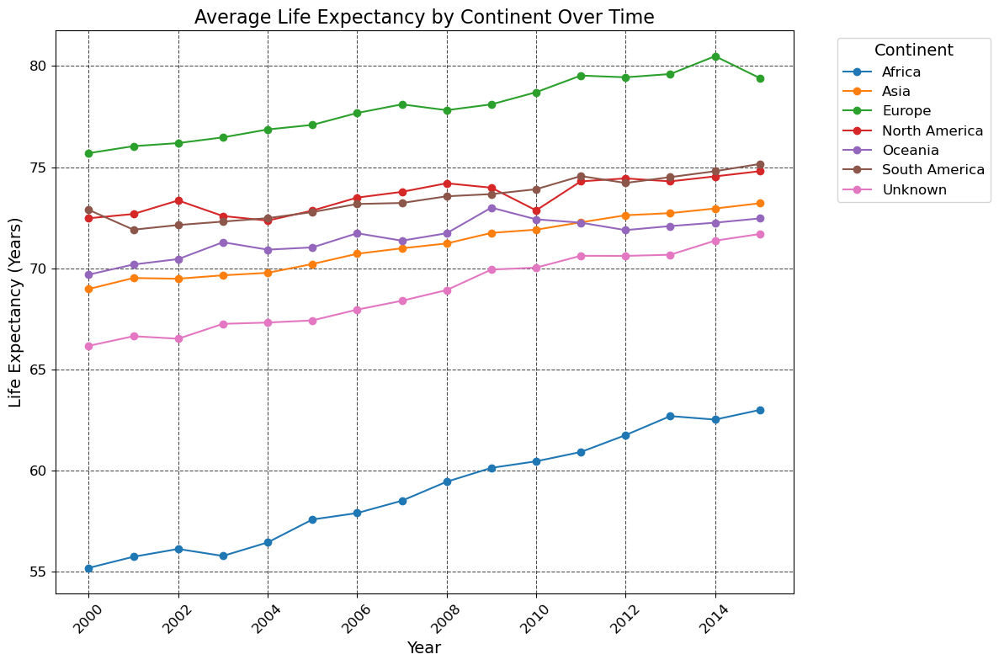

In [402]:

data['Continent'] = data['Country'].map(continent_map).fillna('Unknown')

continent_life_expectancy = (
    data.groupby(['Year', 'Continent'])['Life expectancy']
    .mean()
    .reset_index()
)

plt.figure(figsize=(12, 8))

color_palette = plt.cm.tab10.colors

for i, continent in enumerate(continent_life_expectancy['Continent'].unique()):
    continent_data = continent_life_expectancy[
        continent_life_expectancy['Continent'] == continent
    ]
    plt.plot(
        continent_data['Year'],
        continent_data['Life expectancy'],
        marker='o',
        linestyle='-',
        label=continent,
        color=color_palette[i % len(color_palette)],
    )

plt.title('Average Life Expectancy by Continent Over Time', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Life Expectancy (Years)', fontsize=14)
plt.legend(
    title='Continent',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    fontsize=12,
    title_fontsize=14,
)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()


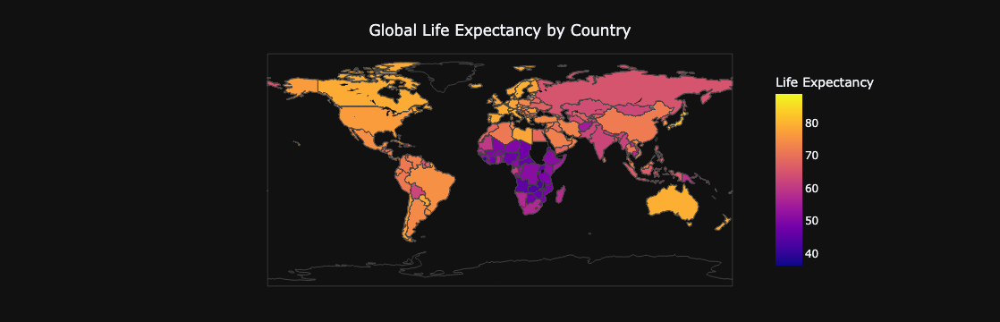

In [403]:
import plotly.express as px

data.columns = data.columns.str.strip()
data = data.dropna(subset=['Life expectancy'])

# Generate a choropleth map with improved contrast
fig = px.choropleth(
    data,
    locations="Country",
    locationmode="country names",
    color="Life expectancy",
    hover_name="Country",
    hover_data={
        "Life expectancy": ":.2f"
    },
    title="Global Life Expectancy by Country",
    color_continuous_scale="Plasma",  # High-contrast color scale
    projection="equirectangular",
    template="plotly_dark"  # Black background
)


fig.update_layout(
    title={
        'text': "<br>Global Life Expectancy by Country<br>",
        'x': 0.5,
        'y': 0.95
    },
    coloraxis_colorbar=dict(
        title="Life Expectancy",
        tickformat=":.0f",  # Remove decimal points from the color bar ticks
        len=0.9,             # Shorten the length of the color bar
        x = 0.85,
        xanchor="center"
    ),
    margin=dict(l=40, r=40, t=60, b=40),  # Adjust margins
)

# Show the figure
fig.show()


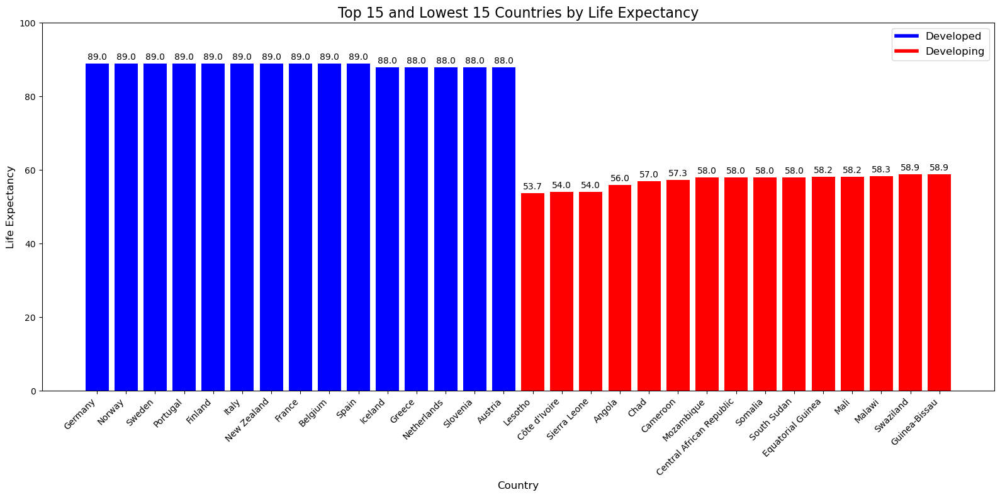

In [404]:

plt.style.use('default')
plt.rcParams.update({
    'axes.facecolor': 'white',   
    'figure.facecolor': 'white',
    'axes.edgecolor': 'black', 
    'grid.color': 'black',      
    'text.color': 'black',     
    'axes.labelcolor': 'black', 
    'xtick.color': 'black',     
    'ytick.color': 'black'    
})

plt.figure(figsize=(16, 8))

colors = ['blue'] * 15 + ['red'] * 15

bars = plt.bar(combined_15_countries.index, combined_15_countries.values, color=colors)

for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
             f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=10, color='black')

plt.title("Top 15 and Lowest 15 Countries by Life Expectancy", fontsize=16, color='black')
plt.xlabel("Country", fontsize=12, color='black')
plt.ylabel("Life Expectancy", fontsize=12, color='black')
plt.ylim(0, 100)

plt.xticks(rotation=45, ha='right', color='black')

blue_patch = plt.Line2D([0], [0], color='blue', lw=4, label='Developed')
red_patch = plt.Line2D([0], [0], color='red', lw=4, label='Developing')
plt.legend(handles=[blue_patch, red_patch], loc='upper right', fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


/var/folders/b0/yfqspp9s4qvb6k9d_n51_bd40000gn/T/ipykernel_20844/746198895.py:1: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



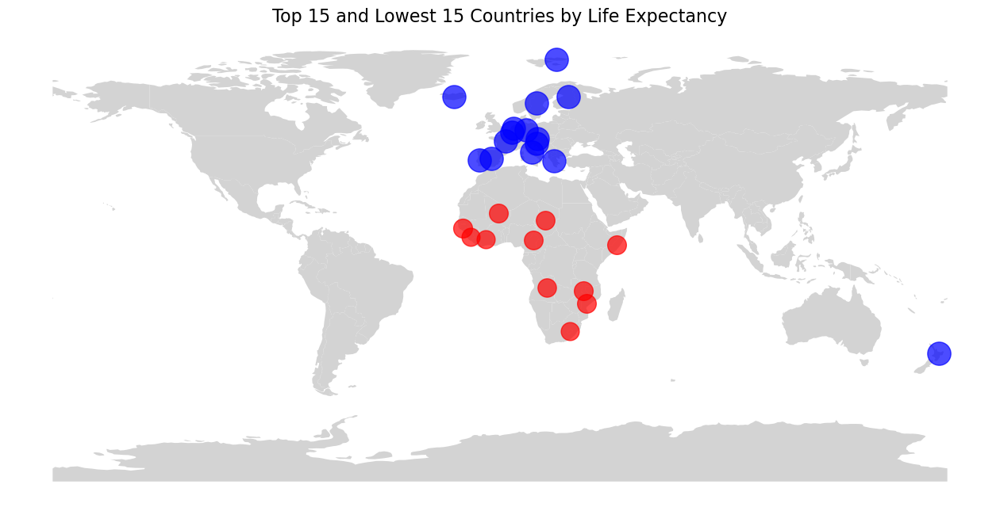

In [387]:

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

combined_countries_df = combined_15_countries.reset_index()
combined_countries_df.columns = ['Country', 'Life Expectancy']
world = world.merge(combined_countries_df, how='left', left_on='name', right_on='Country')

world['coords'] = world['geometry'].representative_point()

fig, ax = plt.subplots(1, 1, figsize=(16, 10))
world.plot(ax=ax, color='lightgrey')  # Base map


for idx, row in world.dropna(subset=['Life Expectancy']).iterrows():
    plt.scatter(row['coords'].x, row['coords'].y, 
                c='blue' if row['Life Expectancy'] > 60 else 'red', 
                s=row['Life Expectancy'] * 5, alpha=0.7, label=row['Country'])

ax.set_title('Top 15 and Lowest 15 Countries by Life Expectancy', fontsize=16)
ax.set_axis_off()

plt.show()


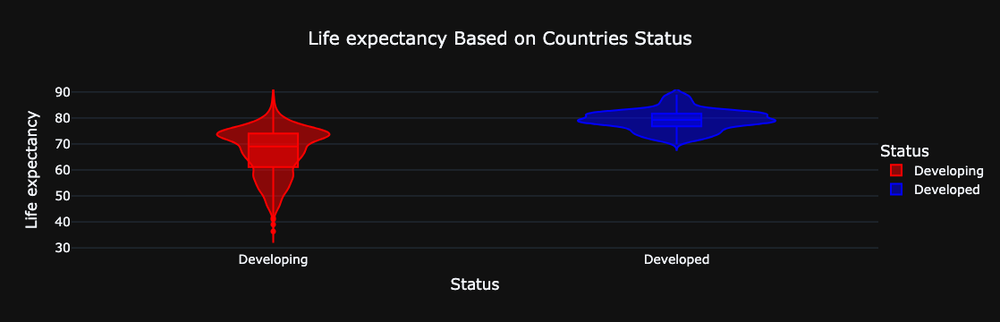

In [348]:
import plotly.express as px

fig = px.violin(
    df,
    x='Status',
    y='Life expectancy ',
    color='Status',
    template='plotly_dark',
    box=True,
    title='Life expectancy Based on Countries Status',
    color_discrete_map={
        'Developed': 'blue',    # Color for developed countries
        'Developing': 'red'  # Color for developing countries
    }
)

fig.update_layout(
    title={'text': 'Life expectancy Based on Countries Status', 'x': 0.5},
    xaxis_title='Status',
    yaxis_title='Life expectancy',
    legend_title_text='Status',
    font=dict(size=14),
    legend=dict(orientation='v', x=1, y=0.5),
    yaxis=dict(
        range=[29, 91],  
        tickvals=[30, 40, 50, 60, 70, 80, 90]
    )
)

fig.show()


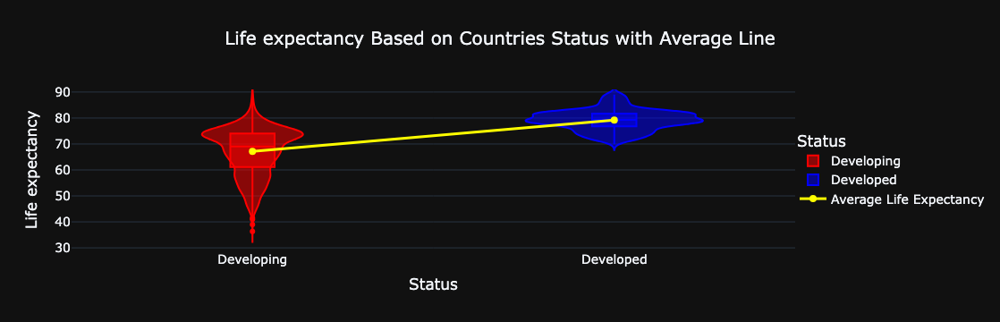

In [349]:
import plotly.express as px
import plotly.graph_objects as go

fig = px.violin(
    df,
    x='Status',
    y='Life expectancy ',
    color='Status',
    template='plotly_dark',
    box=True,
    title='Life expectancy Based on Countries Status',
    color_discrete_map={
        'Developed': 'blue',    # Color for developed countries
        'Developing': 'red'   # Color for developing countries
    }
)

# Group the data to calculate the mean life expectancy for each status
grouped_data = df.groupby('Status')['Life expectancy '].mean().reset_index()

# Add a line chart to the violin plot
fig.add_trace(
    go.Scatter(
        x=grouped_data['Status'], 
        y=grouped_data['Life expectancy '],
        mode='lines+markers',
        line=dict(color='yellow', width=3),
        marker=dict(size=8),
        name='Average Life Expectancy'
    )
)


fig.update_layout(
    title={'text': 'Life expectancy Based on Countries Status with Average Line', 'x': 0.5},
    xaxis_title='Status',
    yaxis_title='Life expectancy',
    legend_title_text='Status',
    font=dict(size=14),
    legend=dict(orientation='v', x=1, y=0.5),
    yaxis=dict(
        range=[29, 91], 
        tickvals=[30, 40, 50, 60, 70, 80, 90]
    )
)

fig.show()


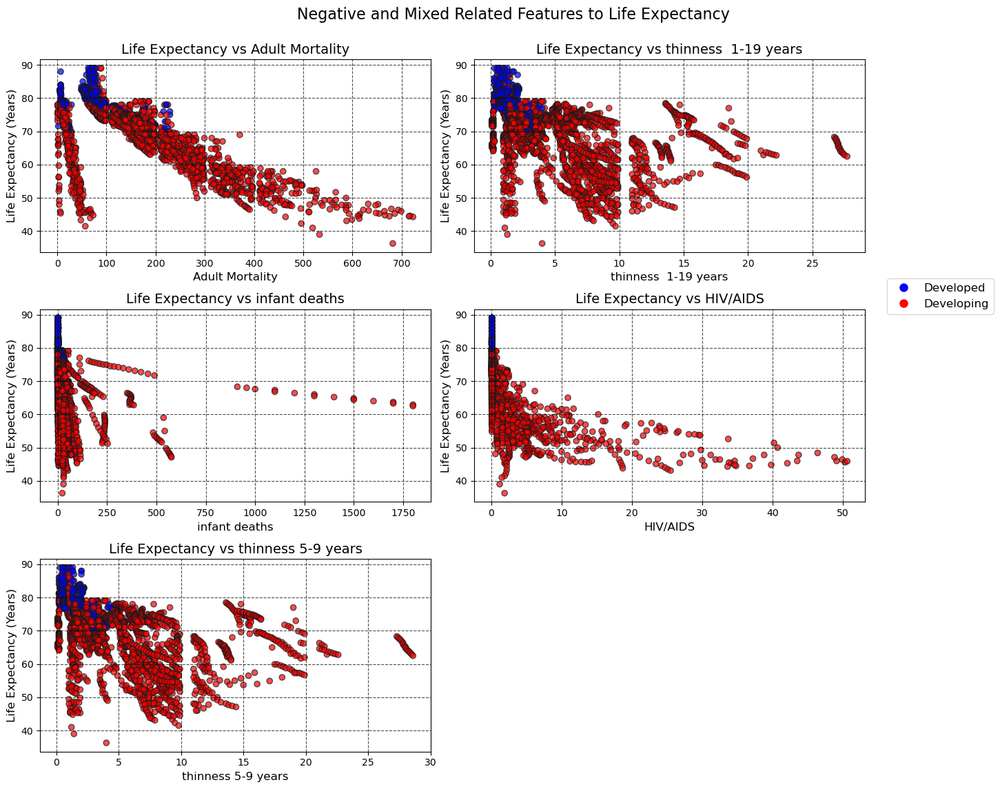

In [351]:
import matplotlib.pyplot as plt
variables = [
    'Adult Mortality', 
    'thinness  1-19 years', 
    'infant deaths', 
    'HIV/AIDS',
    'thinness 5-9 years'
]


colors = data['Status'].map({'Developed': 'blue', 'Developing': 'red'})

# Create subplots for scatter plots
plt.figure(figsize=(15, 12))

for i, var in enumerate(variables, 1):
    plt.subplot(3, 2, i)  # Create a grid of subplots
    plt.scatter(data[var], data['Life expectancy'], c=colors, alpha=0.7, edgecolor='k')
    plt.title(f'Life Expectancy vs {var}', fontsize=14)
    plt.xlabel(var, fontsize=12)
    plt.ylabel('Life Expectancy (Years)', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)

# Add legend for Developed and Developing countries
plt.figlegend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Developed', markerfacecolor='blue', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Developing', markerfacecolor='red', markersize=10),
    ],
    loc='center right',
    bbox_to_anchor=(0.97, 0.6),  # Move legend to the right
    fontsize=12
)

# Add a title for the entire figure
plt.suptitle("Negative and Mixed Related Features to Life Expectancy", fontsize=16, y=0.95)

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space for the title and legend
plt.show()


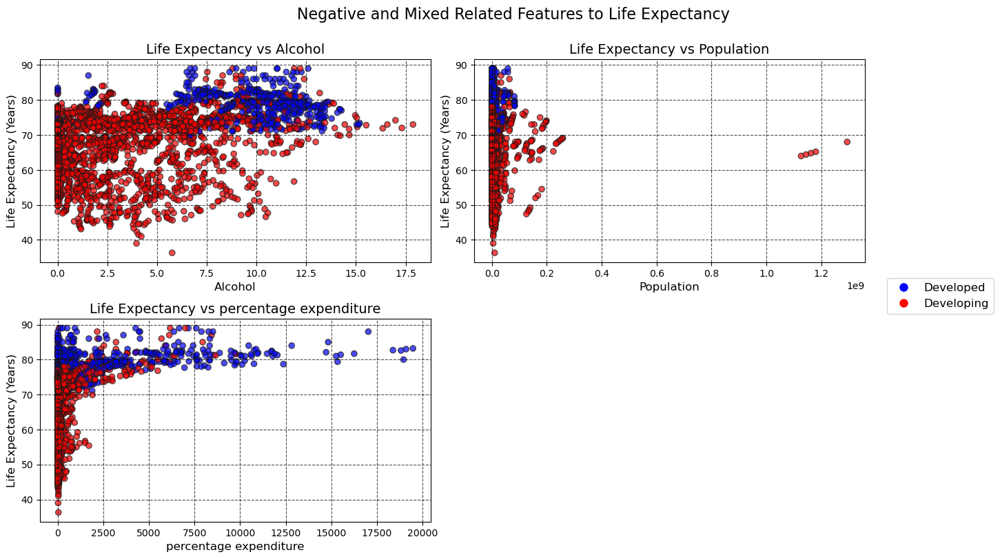

In [399]:
import matplotlib.pyplot as plt

variables = [
    'Alcohol', 
    'Population', 
    'percentage expenditure'
]

colors = data['Status'].map({'Developed': 'blue', 'Developing': 'red'})

plt.figure(figsize=(15, 12))

for i, var in enumerate(variables, 1):
    plt.subplot(3, 2, i)  # Create a grid of subplots
    plt.scatter(data[var], data['Life expectancy'], c=colors, alpha=0.7, edgecolor='k')
    plt.title(f'Life Expectancy vs {var}', fontsize=14)
    plt.xlabel(var, fontsize=12)
    plt.ylabel('Life Expectancy (Years)', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)

plt.figlegend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Developed', markerfacecolor='blue', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Developing', markerfacecolor='red', markersize=10),
    ],
    loc='center right',
    bbox_to_anchor=(0.97, 0.6),  # Move legend to the right
    fontsize=12
)

plt.suptitle("Negative and Mixed Related Features to Life Expectancy", fontsize=16, y=0.95)

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space for the title and legend
plt.show()


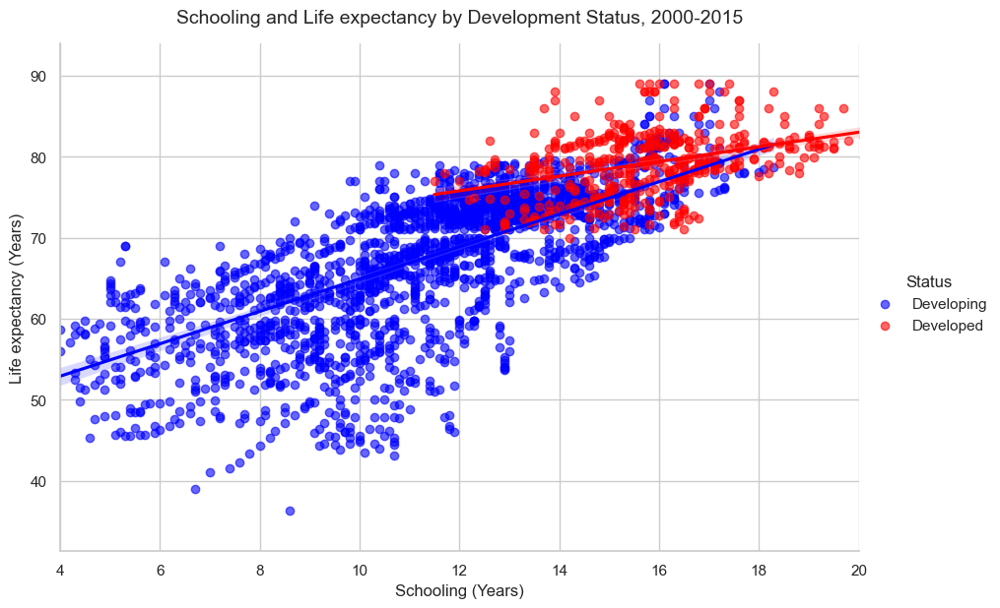

In [353]:

df.columns = df.columns.str.strip()

sns.set_theme(style="whitegrid")

sns.lmplot(
    x="Schooling",
    y="Life expectancy",
    hue="Status",  
    data=df,
    palette={"Developing": "blue", "Developed": "red"},  
    scatter_kws={"alpha": 0.6},  # Set transparency for scatter points
    height=6,  # Set plot height
    aspect=1.5  # Set plot aspect ratio
)

plt.title("Schooling and Life expectancy by Development Status, 2000-2015", fontsize=14, pad=15)
plt.xlabel("Schooling (Years)", fontsize=12)
plt.ylabel("Life expectancy (Years)", fontsize=12)

plt.xlim(4, 20)
plt.ylim(df["Life expectancy"].min() - 5, df["Life expectancy"].max() + 5)

# Show the plot
plt.show()


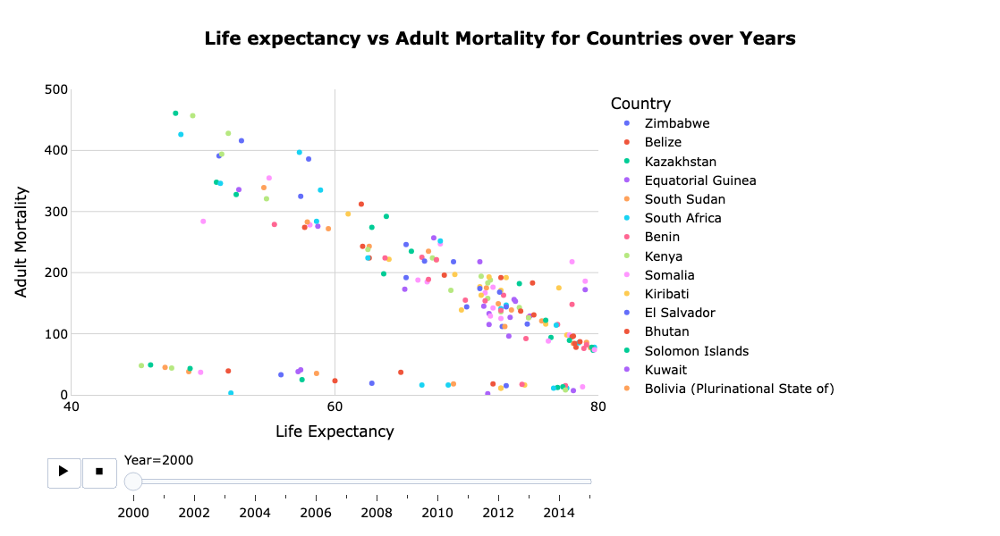

In [354]:

fig = px.scatter(
    df.sort_values(by='Year'),  # Ensure data is sorted by year for consistency
    x='Life expectancy',
    y='Adult Mortality',
    color='Country',  # Color points by Country
    size=None,  # Remove size scaling by Year
    title='Life expectancy vs Adult Mortality for Countries over Years',
    animation_frame='Year',  # Add year animation
)

# Update layout to customize the graph
fig.update_layout(
    title_text='<b>Life expectancy vs Adult Mortality for Countries over Years</b>',
    title_x=0.5,
    height=600,  # Adjust plot height
    xaxis=dict(
        title="Life Expectancy",
        range=[40, 80],  # Set range for Life Expectancy
        tickvals=[40, 60, 80],  # Define tick intervals
        gridcolor='lightgray',  # Change gridline color to light gray
        zerolinecolor='lightgray',  # Change zero line color to light gray
        linecolor='lightgray'  # Change axis line color to light gray
    ),
    yaxis=dict(
        title="Adult Mortality",
        range=[0, 500],  # Set range for Adult Mortality
        tickvals=[0, 100, 200, 300, 400, 500],  # Define tick intervals
        gridcolor='lightgray',  # Change gridline color to light gray
        zerolinecolor='lightgray',  # Change zero line color to light gray
        linecolor='lightgray'  # Change axis line color to light gray
    ),
    font=dict(size=14, color='black'),  # Set font color to black
    legend_title_text='Country',
    plot_bgcolor='white',  # Set the plot background to white
    paper_bgcolor='white'  # Set the outer (paper) background to white
)

# Show the plot
fig.show()


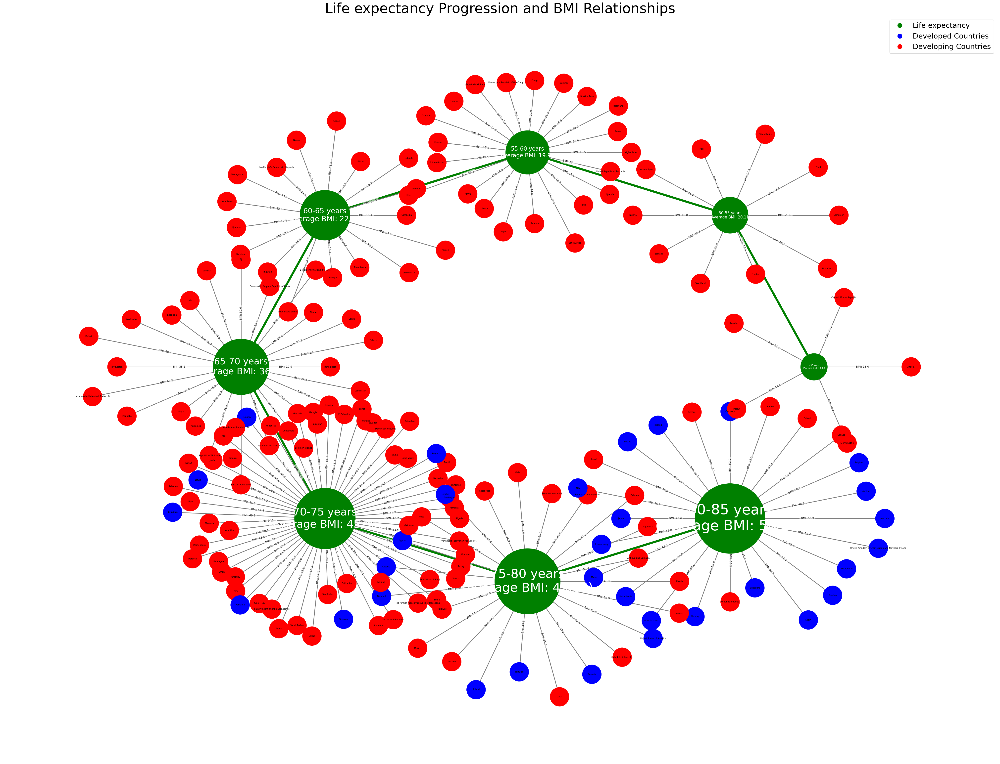

In [397]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import os
data = data.dropna(subset=['Life expectancy', 'BMI', 'Country', 'Status'])
countries = data.groupby('Country', as_index=False).agg({
    'Life expectancy': 'mean',  
    'BMI': 'mean',           
    'Status': 'first'        
})

life_expectancy_bins = [0, 50, 55, 60, 65, 70, 75, 80, 85, 90, 100]
life_expectancy_labels = ["<50 years", "50-55 years", "55-60 years", "60-65 years", "65-70 years", 
                           "70-75 years", "75-80 years", "80-85 years", "85-90 years", "90+ years"]
countries['LifeExpectancyCategory'] = pd.cut(
    countries['Life expectancy'], bins=life_expectancy_bins, labels=life_expectancy_labels
)

 #Calculate average BMI for each Life expectancy Category
avg_bmi_by_life_expectancy = countries.groupby('LifeExpectancyCategory', observed=True)['BMI'].mean()

# Filter out categories with no entries
filtered_life_expectancy_labels = [
    category for category in life_expectancy_labels if category in avg_bmi_by_life_expectancy
]

# Create the graph
for _, row in countries.iterrows():
    country = row['Country']
    life_expectancy = row['LifeExpectancyCategory']
    bmi = row['BMI']
    status = row['Status']
    
    # Add nodes for countries and Life expectancy
    G.add_node(country, type="country", status=status)
    G.add_node(
        life_expectancy, 
        type="life_expectancy",
        description=f"{life_expectancy}\n(Average BMI: {avg_bmi_by_life_expectancy[life_expectancy]:.2f})"
    )

    # Add an edge between the country and Life expectancy with BMI as weight
    if not G.has_edge(country, life_expectancy):
        G.add_edge(country, life_expectancy, weight=bmi, label=f"BMI: {bmi:.1f}")

# Define a mapping for "next level up" connections between Life expectancy categories
life_expectancy_edges = {
    "<50 years": "50-55 years",
    "50-55 years": "55-60 years",
    "55-60 years": "60-65 years",
    "60-65 years": "65-70 years",
    "65-70 years": "70-75 years",
    "70-75 years": "75-80 years",
    "75-80 years": "80-85 years",
    "80-85 years": "85-90 years",
    "85-90 years": "90+ years"
}

# Add edges between Life expectancy nodes
for category, next_category in life_expectancy_edges.items():
    if category in filtered_life_expectancy_labels and next_category in filtered_life_expectancy_labels:
        G.add_edge(category, next_category, weight=1)

#  Generate positions for radial layout with larger spacing
pos = {}
center_spacing = 20  # Increase spacing between Life expectancy nodes
max_shell_radius = 6  # Increase the radius for shells (shorter distances)

# Place Life expectancy nodes in a circular pattern with a larger radius
angle_step_life_expectancy = 360 / len(filtered_life_expectancy_labels)
for i, life_expectancy in enumerate(filtered_life_expectancy_labels):
    angle = np.radians(i * angle_step_life_expectancy)
    pos[life_expectancy] = (center_spacing * np.cos(angle), center_spacing * np.sin(angle))

# Arrange neighbors with greater distances around each Life expectancy node
for life_expectancy in filtered_life_expectancy_labels:
    neighbors = [node for node in G.neighbors(life_expectancy) if G.nodes[node].get('type') == "country"]
    angle_step_neighbors = 360 / len(neighbors) if neighbors else 0
    for j, neighbor in enumerate(neighbors):
        angle = np.radians(j * angle_step_neighbors)
        base_distance = 5 + (G[neighbor][life_expectancy]['weight'] / 10)  # Increased base distance for countries
        random_variability = np.random.uniform(-1.0, 1.0)  # Allow more variability in placement
        distance = min(max(base_distance + random_variability, 2.0), max_shell_radius + 5)  # Ensure within bounds
        x = pos[life_expectancy][0] + distance * np.cos(angle)
        y = pos[life_expectancy][1] + distance * np.sin(angle)
        pos[neighbor] = (x, y)

# Assign node colors based on type
node_colors = [
    'green' if G.nodes[node].get('type') == "life_expectancy" else
    'red' if G.nodes[node].get('status') == "Developing" else
    'blue'
    for node in G.nodes
]

# Assign node sizes based on Life expectancy brackets
node_sizes = [
    6000 + (filtered_life_expectancy_labels.index(node) * 5000) if G.nodes[node].get('type') == "life_expectancy" else 3000
    for node in G.nodes
]

# Create custom labels for nodes
custom_labels = {
    node: G.nodes[node].get('description', node) if G.nodes[node].get('type') == "life_expectancy" else node
    for node in G.nodes
}

# Plot the graph
plt.figure(figsize=(40, 30))  # Increase canvas size for better spacing

# Draw the main graph
nx.draw(
    G, pos,
    with_labels=False,  # Ensure no default labels are drawn
    node_color=node_colors,
    node_size=node_sizes
)

# Draw custom labels
# Draw custom labels inside the nodes
for node, (x, y) in pos.items():
    label_color = 'white' if G.nodes[node].get('type') == "life_expectancy" else 'black'
    node_size = node_sizes[list(G.nodes).index(node)]  # Get the size of the current node
    font_size = max(6, int(node_size / 1000))  # Adjust font size dynamically
    plt.text(
        x, y, custom_labels[node],
        fontsize=font_size,
        ha='center',
        va='center',  # Center the text vertically
        color=label_color
    )


# Separate Life expectancy edges and country-related edges
life_expectancy_edges_list = [
    (u, v) for u, v in G.edges()
    if u in filtered_life_expectancy_labels and v in filtered_life_expectancy_labels
]
other_edges_list = [
    (u, v) for u, v in G.edges()
    if not (u in filtered_life_expectancy_labels and v in filtered_life_expectancy_labels)
]

# Draw Life expectancy edges (green and thick)
nx.draw_networkx_edges(
    G, pos,
    edgelist=life_expectancy_edges_list,
    edge_color='green',
    width=6  # Three times as thick
)

# Draw other edges
nx.draw_networkx_edges(
    G, pos,
    edgelist=other_edges_list,
    edge_color='gray',
    width=2
)

# Add BMI labels to the edges
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(
    G, pos,
    edge_labels=edge_labels,
    font_size=8,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.6)  # Semi-transparent background
)

plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Life expectancy', markersize=15, markerfacecolor='green'),
        plt.Line2D([0], [0], marker='o', color='w', label='Developed Countries', markersize=15, markerfacecolor='blue'),
        plt.Line2D([0], [0], marker='o', color='w', label='Developing Countries', markersize=15, markerfacecolor='red'),
    ],
    loc='upper right',
    fontsize=21
)

plt.title("Life expectancy Progression and BMI Relationships", fontsize=40)
plt.show()


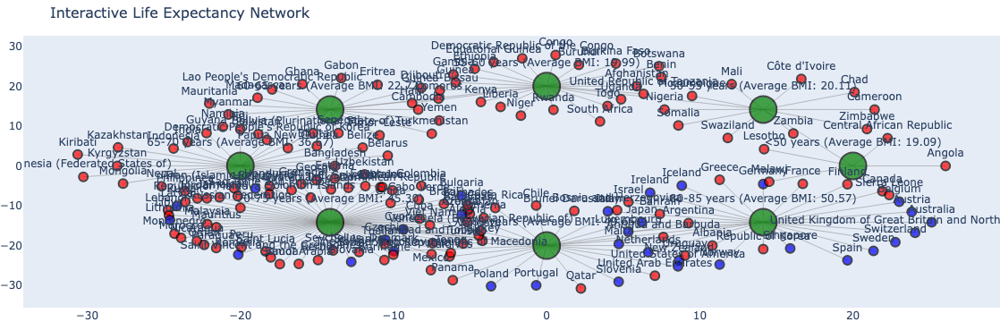

In [395]:
import plotly.graph_objects as go

# Convert NetworkX positions to a format Plotly can understand
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)  
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Create edge traces
edge_trace = go.Scatter(
    x=edge_x,
    y=edge_y,
    line=dict(width=0.5, color='gray'),
    hoverinfo='none',
    mode='lines'
)

# Create node traces
node_x = []
node_y = []
node_text = []
node_color = []
node_size = []

for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(custom_labels[node] if node in custom_labels else node)
    node_color.append(
        'green' if G.nodes[node].get('type') == "life_expectancy" else
        'blue' if G.nodes[node].get('status') == "Developed" else 'red'
    )
    node_size.append(
        30 if G.nodes[node].get('type') == "life_expectancy" else 10
    )

node_trace = go.Scatter(
    x=node_x,
    y=node_y,
    mode='markers+text',
    text=node_text,
    textposition="top center",
    marker=dict(
        size=node_size,
        color=node_color,
        line=dict(width=2, color='black')
    )
)

# Create the interactive figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title="Interactive Life Expectancy Network",
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=40),
                    xaxis=dict(showgrid=False, zeroline=False),
                    yaxis=dict(showgrid=False, zeroline=False)
                ))

# Show the interactive plot
fig.show()


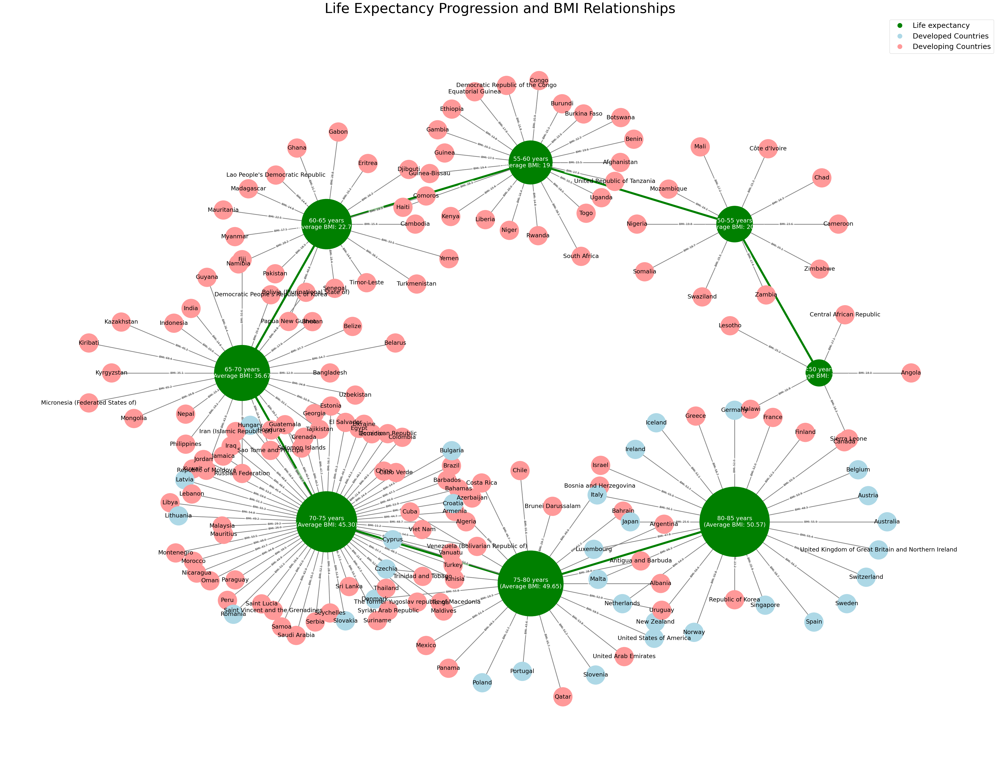

In [396]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import os
data = data.dropna(subset=['Life expectancy', 'BMI', 'Country', 'Status'])
countries = data.groupby('Country', as_index=False).agg({
    'Life expectancy': 'mean',  
    'BMI': 'mean',            
    'Status': 'first'    
})

life_expectancy_bins = [0, 50, 55, 60, 65, 70, 75, 80, 85, 90, 100]
life_expectancy_labels = ["<50 years", "50-55 years", "55-60 years", "60-65 years", "65-70 years", 
                           "70-75 years", "75-80 years", "80-85 years", "85-90 years", "90+ years"]
countries['LifeExpectancyCategory'] = pd.cut(
    countries['Life expectancy'], bins=life_expectancy_bins, labels=life_expectancy_labels
)

# Calculate average BMI for each Life expectancy Category
avg_bmi_by_life_expectancy = countries.groupby('LifeExpectancyCategory', observed=True)['BMI'].mean()

# Filter out categories with no entries
filtered_life_expectancy_labels = [
    category for category in life_expectancy_labels if category in avg_bmi_by_life_expectancy
]

#  Create the graph
for _, row in countries.iterrows():
    country = row['Country']
    life_expectancy = row['LifeExpectancyCategory']
    bmi = row['BMI']
    status = row['Status']
    
    # Add nodes for countries and Life expectancy
    G.add_node(country, type="country", status=status)
    G.add_node(
        life_expectancy, 
        type="life_expectancy",
        description=f"{life_expectancy}\n(Average BMI: {avg_bmi_by_life_expectancy[life_expectancy]:.2f})"
    )

    # Add an edge between the country and Life expectancy with BMI as weight
    if not G.has_edge(country, life_expectancy):
        G.add_edge(country, life_expectancy, weight=bmi, label=f"BMI: {bmi:.1f}")

# Define a mapping for "next level up" connections between Life expectancy categories
life_expectancy_edges = {
    "<50 years": "50-55 years",
    "50-55 years": "55-60 years",
    "55-60 years": "60-65 years",
    "60-65 years": "65-70 years",
    "65-70 years": "70-75 years",
    "70-75 years": "75-80 years",
    "75-80 years": "80-85 years",
    "80-85 years": "85-90 years",
    "85-90 years": "90+ years"
}

# Add edges between Life expectancy nodes
for category, next_category in life_expectancy_edges.items():
    if category in filtered_life_expectancy_labels and next_category in filtered_life_expectancy_labels:
        G.add_edge(category, next_category, weight=1)

#  Generate positions for radial layout with larger spacing
pos = {}
center_spacing = 20  # Increase spacing between Life expectancy nodes
max_shell_radius = 6  # Increase the radius for shells (shorter distances)

# Place Life expectancy nodes in a circular pattern with a larger radius
angle_step_life_expectancy = 360 / len(filtered_life_expectancy_labels)
for i, life_expectancy in enumerate(filtered_life_expectancy_labels):
    angle = np.radians(i * angle_step_life_expectancy)
    pos[life_expectancy] = (center_spacing * np.cos(angle), center_spacing * np.sin(angle))

# Arrange neighbors with greater distances around each Life expectancy node
for life_expectancy in filtered_life_expectancy_labels:
    neighbors = [node for node in G.neighbors(life_expectancy) if G.nodes[node].get('type') == "country"]
    angle_step_neighbors = 360 / len(neighbors) if neighbors else 0
    for j, neighbor in enumerate(neighbors):
        angle = np.radians(j * angle_step_neighbors)
        base_distance = 5 + (G[neighbor][life_expectancy]['weight'] / 10)  # Increased base distance for countries
        random_variability = np.random.uniform(-1.0, 1.0)  # Allow more variability in placement
        distance = min(max(base_distance + random_variability, 2.0), max_shell_radius + 5)  # Ensure within bounds
        x = pos[life_expectancy][0] + distance * np.cos(angle)
        y = pos[life_expectancy][1] + distance * np.sin(angle)
        pos[neighbor] = (x, y)

# Assign node colors based on type
node_colors = [
    'green' if G.nodes[node].get('type') == "life_expectancy" else
    '#FF9999' if G.nodes[node].get('status') == "Developing" else
    '#ADD8E6'
    for node in G.nodes
]

# Assign node sizes based on Life expectancy brackets
node_sizes = [
    6000 + (filtered_life_expectancy_labels.index(node) * 5000) if G.nodes[node].get('type') == "life_expectancy" else 3000
    for node in G.nodes
]

# Create custom labels for nodes
custom_labels = {
    node: G.nodes[node].get('description', node) if G.nodes[node].get('type') == "life_expectancy" else node
    for node in G.nodes
}

# Plot the graph
plt.figure(figsize=(40, 30))  # Increase canvas size for better spacing

# Draw the main graph
nx.draw(
    G, pos,
    with_labels=False,  # Ensure no default labels are drawn
    node_color=node_colors,
    node_size=node_sizes
)

# Draw custom labels
# Draw custom labels inside the nodes
# Draw custom labels inside the nodes
for node, (x, y) in pos.items():
    label_color = 'white' if G.nodes[node].get('type') == "life_expectancy" else 'black'
    plt.text(
        x, y, custom_labels[node],
        fontsize=17,  # Fixed font size
        ha='center',
        va='center',  # Center the text vertically
        color=label_color
    )


# Separate Life expectancy edges and country-related edges
life_expectancy_edges_list = [
    (u, v) for u, v in G.edges()
    if u in filtered_life_expectancy_labels and v in filtered_life_expectancy_labels
]
other_edges_list = [
    (u, v) for u, v in G.edges()
    if not (u in filtered_life_expectancy_labels and v in filtered_life_expectancy_labels)
]

# Draw Life expectancy edges (green and thick)
nx.draw_networkx_edges(
    G, pos,
    edgelist=life_expectancy_edges_list,
    edge_color='green',
    width=6  # Three times as thick
)

# Draw other edges
nx.draw_networkx_edges(
    G, pos,
    edgelist=other_edges_list,
    edge_color='gray',
    width=2
)

# Add BMI labels to the edges
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(
    G, pos,
    edge_labels=edge_labels,
    font_size=8,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.6)  # Semi-transparent background
)

plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Life expectancy', markersize=15, markerfacecolor='green'),
        plt.Line2D([0], [0], marker='o', color='w', label='Developed Countries', markersize=15, markerfacecolor='#ADD8E6'),
        plt.Line2D([0], [0], marker='o', color='w', label='Developing Countries', markersize=15, markerfacecolor='#FF9999'),
    ],
    loc='upper right',
    fontsize=21
)

plt.title("Life Expectancy Progression and BMI Relationships", fontsize=40)
plt.show()


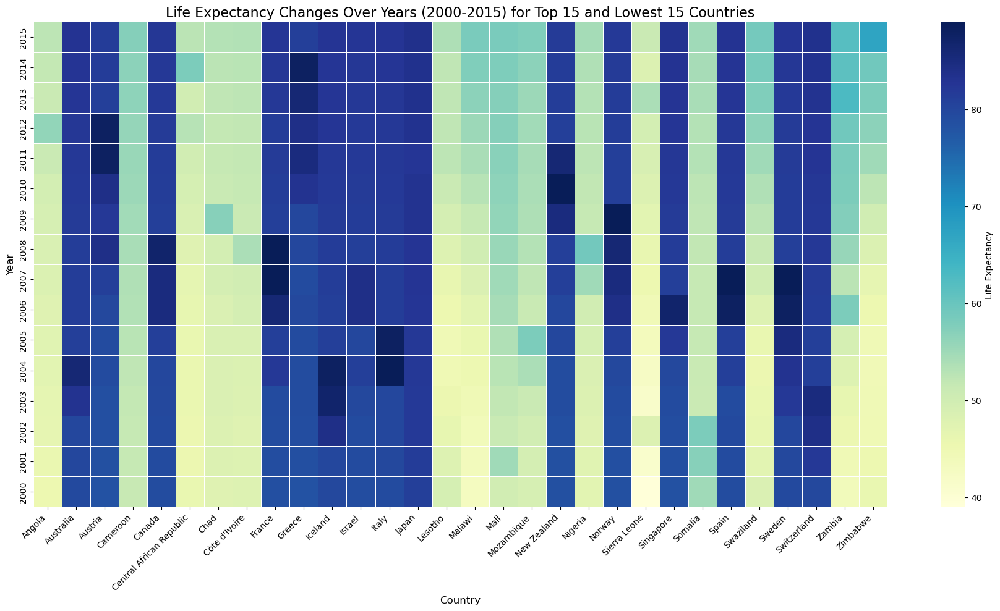

In [318]:

#  Calculate average life expectancy for each country
average_life_expectancy_by_country = data.groupby('Country')['Life expectancy'].mean()

# Get the top 15 and lowest 15 countries by life expectancy
top_15_countries = average_life_expectancy_by_country.nlargest(15)
lowest_15_countries = average_life_expectancy_by_country.nsmallest(15)

#  Filter the dataset for only the selected countries
selected_countries = top_15_countries.index.union(lowest_15_countries.index)
filtered_data = data[data['Country'].isin(selected_countries)]

# Pivot the data to prepare for the heatmap
pivot_table_revised = filtered_data.pivot_table(
    index='Year',  
    columns='Country',  
    values='Life expectancy',  
    aggfunc='mean'  # If duplicates exist, take the mean
)

# Reverse the order of the years to start from 2000 at the bottom
pivot_table_revised = pivot_table_revised.sort_index(ascending=False)

# Plot the heatmap
plt.figure(figsize=(18, 10))
sns.heatmap(
    pivot_table_revised,
    cmap='YlGnBu', 
    annot=False,    
    linewidths=0.5,
    cbar_kws={'label': 'Life Expectancy'}  
)

# Add labels and title
plt.title('Life Expectancy Changes Over Years (2000-2015) for Top 15 and Lowest 15 Countries', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Year', fontsize=12)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


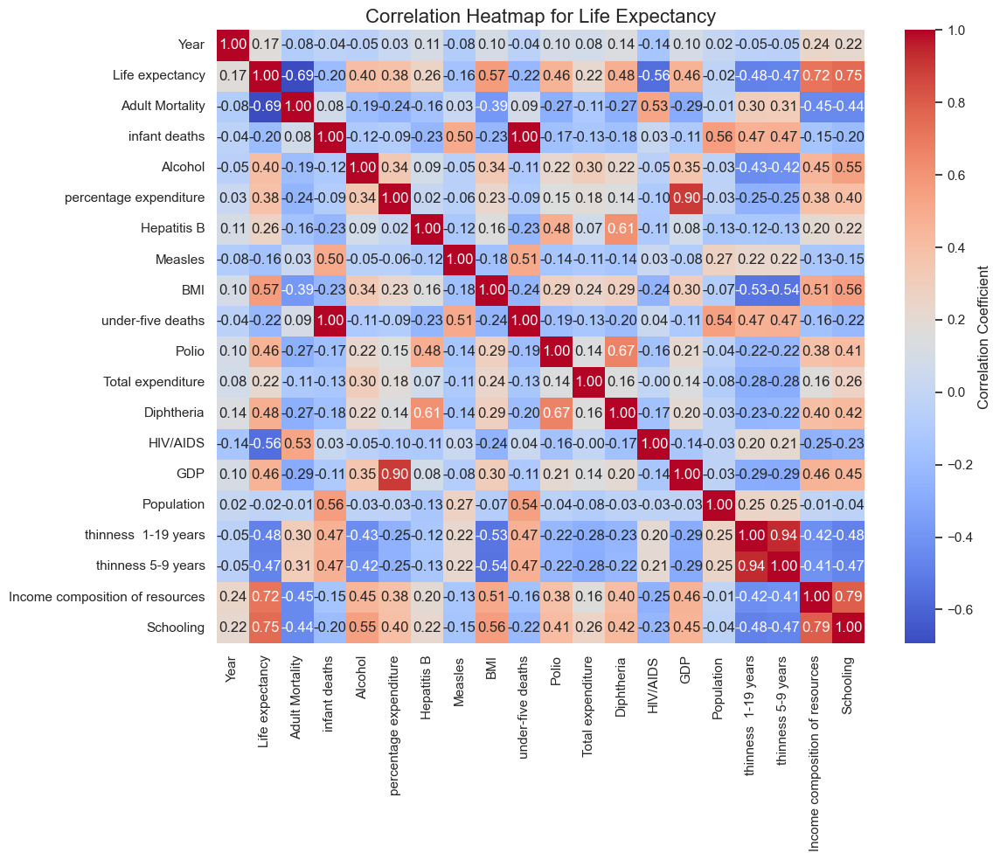

In [357]:

# Select only numerical columns for correlation analysis
numerical_data = data.select_dtypes(include=[np.number])

# Calculate the correlation matrix
correlation_matrix = numerical_data.corr()

# Create a heatmap with correlation coefficients annotated
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation Heatmap for Life Expectancy', fontsize=16)
plt.tight_layout()
plt.show()
